# Trajectory Visualization Survey

This notebook uses the open science 
"Heterogeneous Integrated Dataset for Maritime Intelligence, Surveillance, and Reconnaissance" (https://zenodo.org/record/1167595)
by RAY, Cyril; DRÉO, Richard; CAMOSSI, Elena; JOUSSELME, Anne-Laure 


**Setup:**

```
(base) PS C:\Users\anita> conda create -n geospatial-plus
(base) PS C:\Users\anita> conda activate geospatial-plus
(geospatial-plus) PS C:\Users\anita> mamba install -c conda-forge geospatial
(geospatial-plus) PS C:\Users\anita> mamba install -c conda-forge pymove
(geospatial-plus) PS C:\Users\anita> mamba install -c conda-forge scikit-mobility
(geospatial-plus) PS C:\Users\anita> pip install trackintel
(geospatial-plus) PS C:\Users\anita> mamba install -c conda-forge traja
(geospatial-plus) PS C:\Users\anita> pip install PTRAIL
(geospatial-plus) PS C:\Users\anita> mamba install -c conda-forge transbigdata
```

In [1]:
import io
from os.path import exists
from urllib.request import urlretrieve
from zipfile import ZipFile
from datetime import timedelta
import pandas as pd
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')


In [2]:
def download_from_zenodo(zip_file, url):
    if not exists(zip_file):
        urlretrieve(url, zip_file)

In [3]:
ais_zip_file = 'data/P1_AIS_Data.zip'
download_from_zenodo(ais_zip_file, 'https://zenodo.org/record/1167595/files/%5BP1%5D%20AIS%20Data.zip?download=1')

In [4]:
NROWS = 10000

def csv_to_df(csv_file_name="nari_dynamic.csv"):
    with ZipFile(ais_zip_file) as z:
        with z.open(csv_file_name) as f:
            df = pd.read_csv(f, nrows=NROWS)
            try:
                df['t'] = pd.to_datetime(df['ts'],unit='s')
                df.drop(columns=['ts'])
            except:
                df['t'] = pd.to_datetime(df['t'],unit='s')
            df = df[['t', 'sourcemmsi', 'lon', 'lat']]
            return df
            
df = csv_to_df()

df.head()

,t,sourcemmsi,lon,lat
0,2015-09-30 22:00:02,245257000,-4.465718,48.382490
1,2015-09-30 22:00:03,227705102,-4.496571,48.382420
2,2015-09-30 22:00:04,228131600,-4.644325,48.092247
3,2015-09-30 22:00:05,228051000,-4.485108,48.381320
4,2015-09-30 22:00:06,227574020,-4.495441,48.383660


In [5]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))
gdf

,t,sourcemmsi,lon,lat,geometry
0,2015-09-30 22:00:02,245257000,-4.465718,48.382490,POINT (-4.46572 48.38249)
1,2015-09-30 22:00:03,227705102,-4.496571,48.382420,POINT (-4.49657 48.38242)
2,2015-09-30 22:00:04,228131600,-4.644325,48.092247,POINT (-4.64433 48.09225)
3,2015-09-30 22:00:05,228051000,-4.485108,48.381320,POINT (-4.48511 48.38132)
4,2015-09-30 22:00:06,227574020,-4.495441,48.383660,POINT (-4.49544 48.38366)
...,...,...,...,...,...
9995,2015-10-01 02:03:02,227705102,-4.496548,48.382400,POINT (-4.49655 48.38240)
9996,2015-10-01 02:03:03,228051000,-4.485067,48.381332,POINT (-4.48507 48.38133)
9997,2015-10-01 02:03:05,228374000,-4.769649,48.058800,POINT (-4.76965 48.05880)
9998,2015-10-01 02:03:06,227574020,-4.495477,48.383625,POINT (-4.49548 48.38363)


## MovingPandas



In [6]:
import movingpandas as mpd
mpd.__version__

INFO: Missing optional dependencies. To use the trajectory smoother classes please install Stone Soup (see https://stonesoup.readthedocs.io/en/latest/#installation).


'0.9.rc3'

In [7]:
tc = mpd.TrajectoryCollection(df, 'sourcemmsi', x='lon', y='lat', t='t', min_length=1000)
tc = mpd.MinTimeDeltaGeneralizer(tc).generalize(tolerance=timedelta(minutes=1))
hvplot_defaults = {'tiles':'OSM', 'frame_height':400, 'frame_width':500, 'line_width':5.0}
basic_plot = (tc.hvplot(hover_cols=['sourcemmsi'], **hvplot_defaults) * 
              tc.get_start_locations().hvplot(geo=True, c='white') * 
              tc.get_end_locations().hvplot(geo=True, c='black'))
basic_plot

:Overlay
   .Tiles.I   :Tiles   [x,y]
   .Path.I    :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.II   :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.III  :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.IV   :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.V    :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.VI   :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.VII  :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.VIII :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.IX   :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.X    :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.XI   :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.XII  :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.XIII :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.XIV  :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.XV   :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.XVI  :Path   [Longitude,Latitude]   (sourcemmsi)
   .Path.XVII :Path   [Longitude,Latitude]   (sourcemmsi)
   .Points.I  :Points   [Longitude,Latitude]
   .Points.II :Points   [Longitude,Latitude]

In [8]:
speed_plot = tc.hvplot(title=f'Speed (m/s)', c='speed', cmap='Viridis_r', colorbar=True, **hvplot_defaults)
speed_plot

:Overlay
   .Tiles.I   :Tiles   [x,y]
   .Path.I    :Path   [Longitude,Latitude]   (speed)
   .Path.II   :Path   [Longitude,Latitude]   (speed)
   .Path.III  :Path   [Longitude,Latitude]   (speed)
   .Path.IV   :Path   [Longitude,Latitude]   (speed)
   .Path.V    :Path   [Longitude,Latitude]   (speed)
   .Path.VI   :Path   [Longitude,Latitude]   (speed)
   .Path.VII  :Path   [Longitude,Latitude]   (speed)
   .Path.VIII :Path   [Longitude,Latitude]   (speed)
   .Path.IX   :Path   [Longitude,Latitude]   (speed)
   .Path.X    :Path   [Longitude,Latitude]   (speed)
   .Path.XI   :Path   [Longitude,Latitude]   (speed)
   .Path.XII  :Path   [Longitude,Latitude]   (speed)
   .Path.XIII :Path   [Longitude,Latitude]   (speed)
   .Path.XIV  :Path   [Longitude,Latitude]   (speed)
   .Path.XV   :Path   [Longitude,Latitude]   (speed)
   .Path.XVI  :Path   [Longitude,Latitude]   (speed)
   .Path.XVII :Path   [Longitude,Latitude]   (speed)

In [9]:
(basic_plot + speed_plot).cols(1)

:Layout
   .Overlay.I  :Overlay
      .Tiles.I   :Tiles   [x,y]
      .Path.I    :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.II   :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.III  :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.IV   :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.V    :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.VI   :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.VII  :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.VIII :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.IX   :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.X    :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.XI   :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.XII  :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.XIII :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.XIV  :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.XV   :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.XVI  :Path   [Longitude,Latitude]   (sourcemmsi)
      .Path.XVII :Path   [Longitude,Latitude]   (sourcemmsi)
      .Points.I  :Points   [Longitude,Latitude]
      .Points.II :Points   [Longitude,Latitude]
   .Overlay.II :Overlay
      .Tiles.I   :Tiles   [x,y]
      .Path.I    :Path   [Longitude,Latitude]   (speed)
      .Path.II   :Path   [Longitude,Latitude]   (speed)
      .Path.III  :Path   [Longitude,Latitude]   (speed)
      .Path.IV   :Path   [Longitude,Latitude]   (speed)
      .Path.V    :Path   [Longitude,Latitude]   (speed)
      .Path.VI   :Path   [Longitude,Latitude]   (speed)
      .Path.VII  :Path   [Longitude,Latitude]   (speed)
      .Path.VIII :Path   [Longitude,Latitude]   (speed)
      .Path.IX   :Path   [Longitude,Latitude]   (speed)
      .Path.X    :Path   [Longitude,Latitude]   (speed)
      .Path.XI   :Path   [Longitude,Latitude]   (speed)
      .Path.XII  :Path   [Longitude,Latitude]   (speed)
      .Path.XIII :Path   [Longitude,Latitude]   (speed)
      .Path.XIV  :Path   [Longitude,Latitude]   (speed)
      .Path.XV   :Path   [Longitude,Latitude]   (speed)
      .Path.XVI  :Path   [Longitude,Latitude]   (speed)
      .Path.XVII :Path   [Longitude,Latitude]   (speed)

## Scikit-mobility 


In [10]:
import skmob
skmob.__version__

'1.2.3'

In [11]:
tdf = skmob.TrajDataFrame(df, latitude='lat', longitude='lon', datetime='t', user_id='sourcemmsi')
tdf.plot_trajectory(zoom=9, weight=3, opacity=0.9, tiles='OpenStreetMap', max_users=100)

## Trackintel

In [12]:
import trackintel as ti
ti.__version__

'1.1.5'

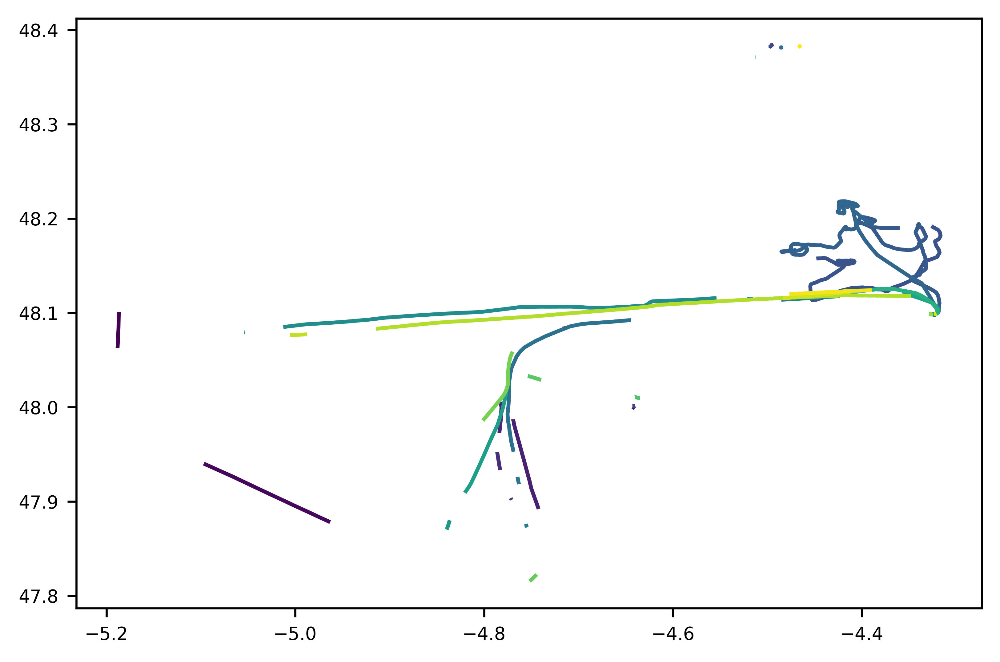

In [13]:
pfs = ti.io.from_geopandas.read_positionfixes_gpd(gdf, tracked_at='t', user_id='sourcemmsi')
pfs, sp = pfs.as_positionfixes.generate_staypoints(method='sliding')  # dist_threshold=10)
pfs, tpls = pfs.as_positionfixes.generate_triplegs(sp, method='between_staypoints')
tpls.as_triplegs.plot()

## Traja


In [14]:
import traja
traja.__version__

'0.2.13'

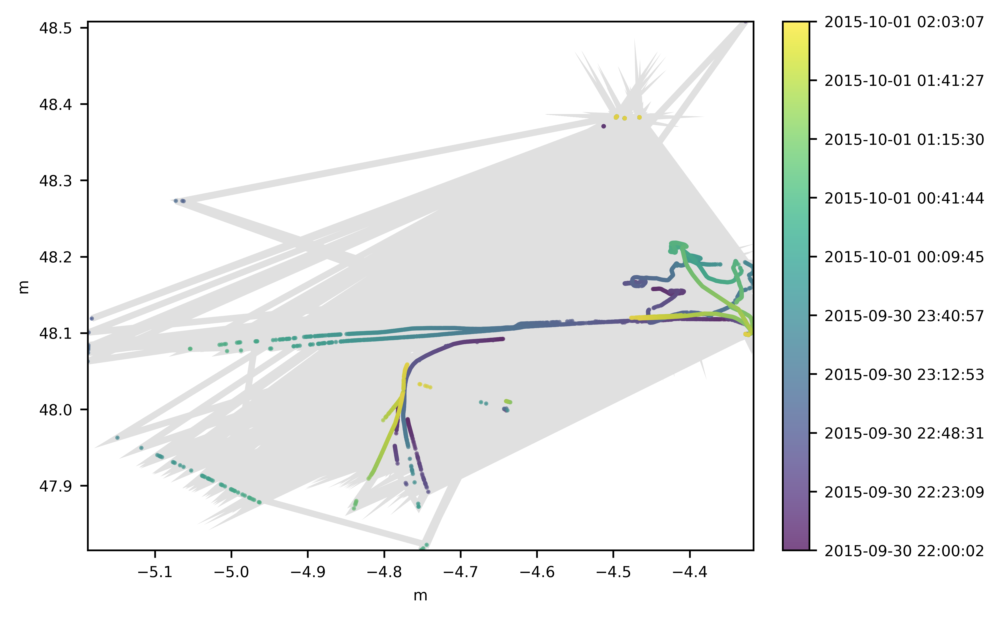

In [15]:
trj = traja.TrajaDataFrame(df.rename(columns={"lon": "x", "lat": "y", "t": "time"}))
trj.traja.plot()

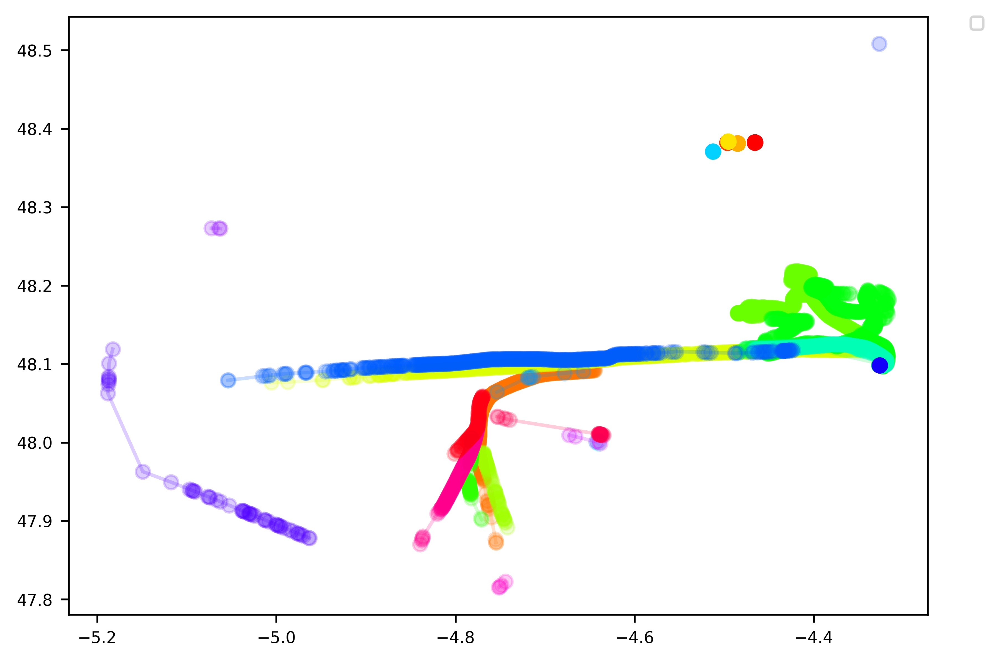

In [16]:
trjs = traja.TrajaCollection(df.rename(columns={"lon": "x", "lat": "y", "t": "time"}), id_col="sourcemmsi")
lines = trjs.plot()

In [17]:
help(trjs.plot)

Help on method plot in module traja.frame:

plot(colors=None, **kwargs) method of traja.frame.TrajaCollection instance
    Plot collection of trajectories with colors assigned to each id.
    
    >>> trjs = {ind: traja.generate(seed=ind) for ind in range(3)} # doctest: +SKIP
    >>> coll = traja.TrajaCollection(trjs) # doctest: +SKIP
    >>> coll.plot() # doctest: +SKIP



## TransBigData

In [18]:
import transbigdata as tbd

<AxesSubplot:>

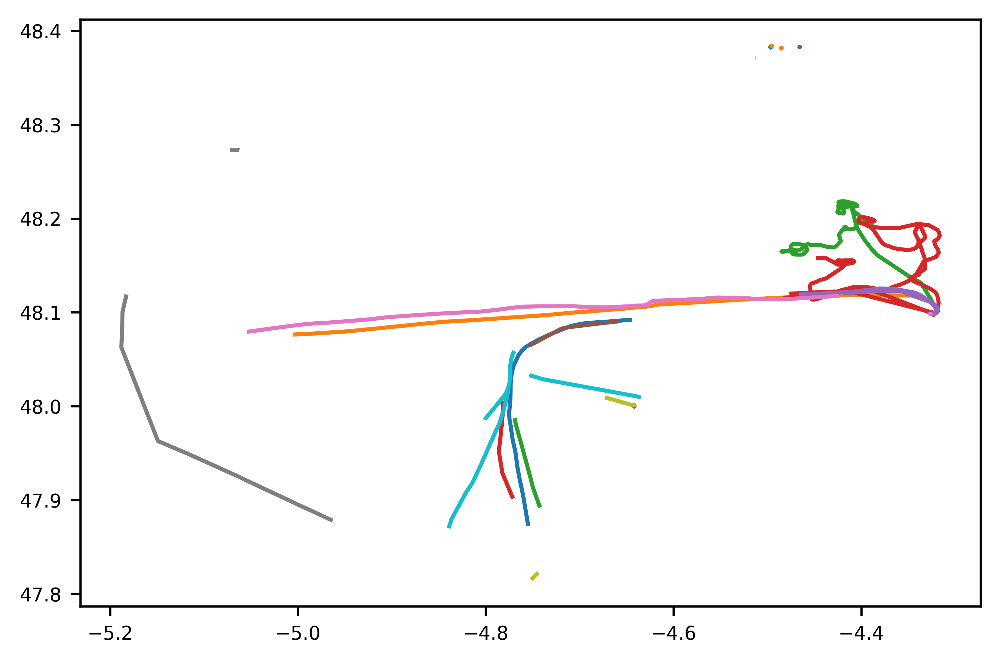

In [19]:
traj_gdf = tbd.points_to_traj(df, col=['lon','lat','sourcemmsi'])
traj_gdf.plot(column='sourcemmsi', categories=df.sourcemmsi.unique().tolist())

In [20]:
tbd.visualization_trip(df, col=['lon','lat','sourcemmsi','t'])

Processing trajectory data...
Generate visualization...
User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': 'hizm36i', 'type': …

## PTRAIL

In [21]:
from ptrail.core.TrajectoryDF import PTRAILDataFrame
from ptrail.visualization.TrajPlotter import TrajectoryPlotter
import ptrail
ptrail.__version__

'0.7.1 Beta'

In [22]:
pdf = PTRAILDataFrame(data_set=df, latitude='lat', longitude='lon', datetime='t', traj_id='sourcemmsi', rest_of_columns=[])
TrajectoryPlotter.show_trajectories(pdf)

AttributeError: 'PTRAILDataFrame' object has no attribute '_mgr'

In [ ]:
pdf.head(5)

In [ ]:
from ptrail.core.Datasets import Datasets
starkey = Datasets.load_starkey()
starkey.head(5)

In [ ]:
from ptrail.visualization.TrajPlotter import TrajectoryPlotter as tpl
tpl.show_trajectories(starkey, opacity=0.75, weight=2)

## PyMove

In [23]:
import pymove as pm
import folium as f
import matplotlib as mpl
from pymove.utils import visual
pm.__version__

ImportError: cannot import name 'FilePathOrBuffer' from 'pandas._typing' (H:\miniconda3\envs\geospatial-plus\lib\site-packages\pandas\_typing.py)

In [ ]:
def csv_to_pymove_df(csv_file_name):
    with ZipFile(ais_zip_file) as z:
        with z.open(csv_file_name) as f:
            df = pm.read_csv(f)
            return df.head(NROWS)
        
move_df = csv_to_pymove_df("nari_dynamic.csv")        

# Appendix

```
(geospatial-plus) PS C:\Users\anita> conda list
# packages in environment at H:\miniconda3\envs\geospatial-plus:
#
# Name                    Version                   Build  Channel
abseil-cpp                20210324.2           h0e60522_0    conda-forge
aenum                     3.1.8              pyhd8ed1ab_0    conda-forge
affine                    2.3.1              pyhd8ed1ab_0    conda-forge
aiohttp                   3.8.1            py39hb82d6ee_1    conda-forge
aiosignal                 1.2.0              pyhd8ed1ab_0    conda-forge
alabaster                 0.7.12             pyhd3eb1b0_0
altair                    4.2.0              pyhd8ed1ab_1    conda-forge
aniso8601                 9.0.1              pyhd8ed1ab_0    conda-forge
anyio                     3.5.0            py39hcbf5309_0    conda-forge
aom                       3.3.0                h0e60522_1    conda-forge
appdirs                   1.4.4              pyh9f0ad1d_0    conda-forge
argh                      0.26.2          pyh9f0ad1d_1002    conda-forge
argon2-cffi               21.3.0             pyhd8ed1ab_0    conda-forge
argon2-cffi-bindings      21.2.0           py39hb82d6ee_2    conda-forge
arrow-cpp                 7.0.0           py39h38522ff_4_cpu    conda-forge
asciitree                 0.3.3                      py_2    conda-forge
astor                     0.8.1              pyh9f0ad1d_0    conda-forge
asttokens                 2.0.5              pyhd8ed1ab_0    conda-forge
async-timeout             4.0.2              pyhd8ed1ab_0    conda-forge
atomicwrites              1.4.0              pyh9f0ad1d_0    conda-forge
attrs                     21.4.0             pyhd8ed1ab_0    conda-forge
aws-c-cal                 0.5.11               he19cf47_0    conda-forge
aws-c-common              0.6.2                h8ffe710_0    conda-forge
aws-c-event-stream        0.2.7               h70e1b0c_13    conda-forge
aws-c-io                  0.10.5               h2fe331c_0    conda-forge
aws-checksums             0.1.11               h1e232aa_7    conda-forge
aws-sdk-cpp               1.8.186              hb0612c5_3    conda-forge
babel                     2.9.1              pyh44b312d_0    conda-forge
backcall                  0.2.0              pyh9f0ad1d_0    conda-forge
backports                 1.0                        py_2    conda-forge
backports.functools_lru_cache 1.6.4              pyhd8ed1ab_0    conda-forge
base58                    2.1.1              pyhd8ed1ab_0    conda-forge
beautifulsoup4            4.11.1             pyha770c72_0    conda-forge
black                     22.3.0             pyhd8ed1ab_0    conda-forge
black-jupyter             22.3.0               hd8ed1ab_0    conda-forge
blas                      1.0                         mkl    conda-forge
bleach                    5.0.0              pyhd8ed1ab_0    conda-forge
blinker                   1.4                        py_1    conda-forge
blosc                     1.21.0               h0e60522_0    conda-forge
bokeh                     2.4.2            py39hcbf5309_1    conda-forge
boost-cpp                 1.74.0               h9f4b32c_8    conda-forge
boto3                     1.21.42            pyhd8ed1ab_0    conda-forge
botocore                  1.24.42            pyhd8ed1ab_0    conda-forge
bqplot                    0.12.33            pyhd8ed1ab_0    conda-forge
branca                    0.4.2              pyhd8ed1ab_0    conda-forge
brotlipy                  0.7.0           py39hb82d6ee_1004    conda-forge
bump2version              1.0.1              pyh9f0ad1d_0    conda-forge
bzip2                     1.0.8                h8ffe710_4    conda-forge
c-ares                    1.18.1               h8ffe710_0    conda-forge
c-blosc2                  2.0.4                h09319c2_1    conda-forge
ca-certificates           2022.6.15            h5b45459_0    conda-forge
cached-property           1.5.2                hd8ed1ab_1    conda-forge
cached_property           1.5.2              pyha770c72_1    conda-forge
cachetools                4.2.4              pyhd8ed1ab_0    conda-forge
cairo                     1.16.0            h15b3021_1010    conda-forge
cairocffi                 1.2.0              pyhd8ed1ab_0    conda-forge
cairosvg                  2.5.2              pyhd8ed1ab_0    conda-forge
cartopy                   0.20.2           py39h07f1d72_4    conda-forge
cenpy                     1.0.0.post4                py_0    conda-forge
certifi                   2022.6.15        py39hcbf5309_0    conda-forge
cffi                      1.15.0           py39h0878f49_0    conda-forge
cfitsio                   4.1.0                h5a969a9_0    conda-forge
cftime                    1.6.0            py39h5d4886f_1    conda-forge
charls                    2.3.4                h39d44d4_0    conda-forge
charset-normalizer        2.0.12             pyhd8ed1ab_0    conda-forge
chroma-py                 0.1.0.dev1                 py_0    conda-forge
click                     8.1.2            py39hcbf5309_0    conda-forge
click-plugins             1.1.1                      py_0    conda-forge
cligj                     0.7.2              pyhd8ed1ab_1    conda-forge
cloudpickle               2.0.0              pyhd8ed1ab_0    conda-forge
codespell                 2.1.0              pyhd8ed1ab_0    conda-forge
colorama                  0.4.4              pyh9f0ad1d_0    conda-forge
colorcet                  3.0.0              pyhd8ed1ab_0    conda-forge
colour                    0.1.5                      py_0    conda-forge
commonmark                0.9.1              pyhd3eb1b0_0
configobj                 5.0.6                      py_0    conda-forge
contextily                1.2.0              pyhd8ed1ab_0    conda-forge
convertdate               2.4.0              pyhd8ed1ab_0    conda-forge
cryptography              36.0.2           py39h7bc7c5c_1    conda-forge
cssselect2                0.2.1              pyh9f0ad1d_1    conda-forge
curl                      7.82.0               h789b8ee_0    conda-forge
cycler                    0.11.0             pyhd8ed1ab_0    conda-forge
cytoolz                   0.11.2           py39hb82d6ee_2    conda-forge
dask                      2022.4.1           pyhd8ed1ab_0    conda-forge
dask-core                 2022.4.1           pyhd8ed1ab_0    conda-forge
dask-geopandas            0.1.0              pyhd8ed1ab_0    conda-forge
dataclasses               0.8                pyhc8e2a94_3    conda-forge
dataclasses-json          0.5.7              pyhd8ed1ab_0    conda-forge
datacube                  1.8.6              pyhd8ed1ab_0    conda-forge
datashader                0.13.0             pyh6c4a22f_0    conda-forge
datashape                 0.5.4                      py_1    conda-forge
debugpy                   1.6.0            py39h415ef7b_0    conda-forge
decorator                 5.1.1              pyhd8ed1ab_0    conda-forge
defusedxml                0.7.1              pyhd8ed1ab_0    conda-forge
deprecated                1.2.12             pyhd3eb1b0_0
descartes                 1.1.0                      py_4    conda-forge
dimcli                    0.9.7.2            pyhd8ed1ab_0    conda-forge
distributed               2022.4.1           pyhd8ed1ab_0    conda-forge
docutils                  0.18.1           py39hcbf5309_1    conda-forge
donfig                    0.7.0              pyhd8ed1ab_1    conda-forge
double-conversion         3.2.0                h0e60522_0    conda-forge
earthengine-api           0.1.306            pyhd8ed1ab_0    conda-forge
earthpy                   0.9.4              pyhd8ed1ab_0    conda-forge
easystac                  0.0.1              pyhd8ed1ab_0    conda-forge
ee_extra                  0.0.13             pyhd8ed1ab_0    conda-forge
eemont                    0.3.4              pyhd8ed1ab_0    conda-forge
eigen                     3.4.0                h2d74725_0    conda-forge
entrypoints               0.4                pyhd8ed1ab_0    conda-forge
eomaps                    3.5                pyhd8ed1ab_0    conda-forge
executing                 0.8.3              pyhd8ed1ab_0    conda-forge
expat                     2.4.8                h39d44d4_0    conda-forge
fastdtw                   0.3.4            py39h832f523_1    conda-forge
fasteners                 0.17.3             pyhd8ed1ab_0    conda-forge
ffmpeg                    4.3.1                ha925a31_0    conda-forge
ffmpeg-python             0.2.0                      py_0    conda-forge
filelock                  3.6.0              pyhd8ed1ab_0    conda-forge
fiona                     1.8.21           py39hd99abff_0    conda-forge
flask                     2.1.1              pyhd8ed1ab_0    conda-forge
flask-caching             1.10.1             pyhd8ed1ab_0    conda-forge
flask-cors                3.0.10             pyhd3eb1b0_0
flask-restx               0.5.1              pyhd8ed1ab_0    conda-forge
flit-core                 3.7.1              pyhd8ed1ab_0    conda-forge
folium                    0.12.1.post1       pyhd8ed1ab_1    conda-forge
font-ttf-dejavu-sans-mono 2.37                 hab24e00_0    conda-forge
font-ttf-inconsolata      3.000                h77eed37_0    conda-forge
font-ttf-source-code-pro  2.038                h77eed37_0    conda-forge
font-ttf-ubuntu           0.83                 hab24e00_0    conda-forge
fontconfig                2.14.0               hce3cb01_0    conda-forge
fonts-conda-ecosystem     1                             0    conda-forge
fonts-conda-forge         1                             0    conda-forge
freetype                  2.10.4               h546665d_1    conda-forge
freexl                    1.0.6                ha8e266a_0    conda-forge
frozenlist                1.3.0            py39hb82d6ee_1    conda-forge
fsspec                    2022.3.0           pyhd8ed1ab_0    conda-forge
future                    0.18.2           py39hcbf5309_5    conda-forge
fuzzywuzzy                0.18.0             pyhd8ed1ab_0    conda-forge
gdal                      3.4.2            py39h3f5efd6_5    conda-forge
gdown                     4.4.0              pyhd8ed1ab_0    conda-forge
geeadd                    0.5.4              pyhd8ed1ab_0    conda-forge
geemap                    0.13.11            pyhd8ed1ab_0    conda-forge
gemgis                    0.1.18             pyhd8ed1ab_0    conda-forge
geoalchemy2               0.6.3                      py_0    conda-forge
geocoder                  1.38.1                     py_1    conda-forge
geocube                   0.2.0              pyhd8ed1ab_0    conda-forge
geographiclib             1.52               pyhd8ed1ab_0    conda-forge
geohash2                  1.1                        py_0    conda-forge
geojson                   2.5.0                      py_0    conda-forge
geomet                    0.3.0              pyhd3deb0d_0    conda-forge
geopandas                 0.10.2             pyhd8ed1ab_1    conda-forge
geopandas-base            0.10.2             pyha770c72_1    conda-forge
geopy                     2.2.0              pyhd8ed1ab_0    conda-forge
geos                      3.10.2               h39d44d4_0    conda-forge
geospatial                0.6.0              pyhd8ed1ab_0    conda-forge
geotiff                   1.7.1                h38b14a8_1    conda-forge
geoviews                  1.9.5              pyhd8ed1ab_0    conda-forge
geoviews-core             1.9.5              pyha770c72_0    conda-forge
gettext                   0.19.8.1          ha2e2712_1008    conda-forge
gflags                    2.2.2             ha925a31_1004    conda-forge
giflib                    5.2.1                h8d14728_2    conda-forge
gitdb                     4.0.9              pyhd8ed1ab_0    conda-forge
gitpython                 3.1.27             pyhd8ed1ab_0    conda-forge
gl2ps                     1.4.2                h0597ee9_0    conda-forge
glew                      2.1.0                h39d44d4_2    conda-forge
glog                      0.6.0                h4797de2_0    conda-forge
glpk                      4.65              h8ffe710_1004    conda-forge
google-api-core           1.31.5             pyhd8ed1ab_0    conda-forge
google-api-python-client  1.12.8             pyhd3deb0d_0    conda-forge
google-auth               1.35.0             pyh6c4a22f_0    conda-forge
google-auth-httplib2      0.1.0              pyhd8ed1ab_0    conda-forge
google-cloud-core         1.7.2              pyh6c4a22f_0    conda-forge
google-cloud-storage      2.1.0              pyh6c4a22f_0    conda-forge
google-crc32c             1.1.2            py39h3fc79e4_2    conda-forge
google-resumable-media    2.1.0              pyh6c4a22f_0    conda-forge
googleapis-common-protos  1.56.0           py39h35db3c3_0    conda-forge
greenlet                  1.1.2            py39h415ef7b_2    conda-forge
grpc-cpp                  1.43.2               he33f7c1_1    conda-forge
grpcio                    1.45.0           py39hb76b349_0    conda-forge
h3                        3.7.2                h39d44d4_0    conda-forge
h3-py                     3.7.3            py39h415ef7b_4    conda-forge
h5py                      3.6.0           nompi_py39hd4deaf1_100    conda-forge
hampel                    0.0.5                    pypi_0    pypi
hdf4                      4.2.15               h0e5069d_3    conda-forge
hdf5                      1.12.1          nompi_h2a0e4a3_104    conda-forge
heapdict                  1.0.1                      py_0    conda-forge
here-map-widget-for-jupyter 1.1.3              pyhd8ed1ab_0    conda-forge
hijri-converter           2.2.3              pyhd8ed1ab_0    conda-forge
holidays                  0.13               pyhd8ed1ab_0    conda-forge
holoviews                 1.14.8             pyhd8ed1ab_0    conda-forge
html2text                 2020.1.16                  py_0    conda-forge
httplib2                  0.20.4             pyhd8ed1ab_0    conda-forge
httplib2shim              0.0.3              pyh9f0ad1d_0    conda-forge
hvplot                    0.7.3              pyh6c4a22f_0    conda-forge
icu                       69.1                 h0e60522_0    conda-forge
idna                      3.3                pyhd8ed1ab_0    conda-forge
imagecodecs               2022.2.22        py39hc1e9cd8_4    conda-forge
imageio                   2.16.2             pyhcf75d05_0    conda-forge
imagesize                 1.3.0              pyhd3eb1b0_0
importlib-metadata        4.11.3           py39hcbf5309_1    conda-forge
importlib_metadata        4.11.3               hd8ed1ab_1    conda-forge
importlib_resources       5.7.0              pyhd8ed1ab_0    conda-forge
iniconfig                 1.1.1              pyh9f0ad1d_0    conda-forge
intel-openmp              2022.0.0          h57928b3_3663    conda-forge
ipycanvas                 0.11.0             pyhd8ed1ab_0    conda-forge
ipyevents                 2.0.1              pyhd8ed1ab_0    conda-forge
ipyfilechooser            0.6.0              pyhd8ed1ab_0    conda-forge
ipygany                   0.5.0              pyhd8ed1ab_0    conda-forge
ipykernel                 6.13.0           py39h832f523_0    conda-forge
ipyleaflet                0.16.0             pyhd8ed1ab_3    conda-forge
ipympl                    0.9.1              pyhd8ed1ab_0    conda-forge
ipynb-py-convert          0.4.6              pyh9f0ad1d_0    conda-forge
ipysheet                  0.5.0              pyhd8ed1ab_0    conda-forge
ipython                   8.2.0            py39hcbf5309_0    conda-forge
ipython_genutils          0.2.0                      py_1    conda-forge
ipytree                   0.2.1              pyhd8ed1ab_0    conda-forge
ipyvtklink                0.2.2              pyhd8ed1ab_0    conda-forge
ipywidgets                7.7.0              pyhd8ed1ab_0    conda-forge
itsdangerous              2.1.2              pyhd8ed1ab_0    conda-forge
jbig                      2.1               h8d14728_2003    conda-forge
jedi                      0.18.1           py39hcbf5309_1    conda-forge
jinja2                    3.0.3              pyhd8ed1ab_0    conda-forge
jmespath                  1.0.0              pyhd8ed1ab_0    conda-forge
joblib                    1.1.0              pyhd8ed1ab_0    conda-forge
jpeg                      9e                   h8ffe710_0    conda-forge
json5                     0.9.5              pyh9f0ad1d_0    conda-forge
jsoncpp                   1.9.5                h2d74725_1    conda-forge
jsonschema                4.4.0              pyhd8ed1ab_0    conda-forge
jupyter_client            7.2.2              pyhd8ed1ab_1    conda-forge
jupyter_core              4.9.2            py39hcbf5309_0    conda-forge
jupyter_server            1.16.0             pyhd8ed1ab_1    conda-forge
jupyterlab                3.3.4              pyhd8ed1ab_0    conda-forge
jupyterlab_pygments       0.2.2              pyhd8ed1ab_0    conda-forge
jupyterlab_server         2.12.0             pyhd8ed1ab_0    conda-forge
jupyterlab_widgets        1.1.0              pyhd8ed1ab_0    conda-forge
jupytext                  1.13.8             pyh4b9bcc7_0    conda-forge
jxrlib                    1.1                  h8ffe710_2    conda-forge
kealib                    1.4.14               h8995ca9_3    conda-forge
keplergl                  0.3.2              pyhd8ed1ab_0    conda-forge
kiwisolver                1.4.2            py39h2e07f2f_1    conda-forge
korean_lunar_calendar     0.2.1              pyh9f0ad1d_0    conda-forge
krb5                      1.19.3               h1176d77_0    conda-forge
large-image               1.13.0             pyhd8ed1ab_0    conda-forge
large-image-source-gdal   1.13.0             pyhd8ed1ab_0    conda-forge
lark-parser               0.12.0             pyhd8ed1ab_0    conda-forge
laspy                     2.1.2              pyh8a188c0_0    conda-forge
lcms2                     2.12                 h2a16943_0    conda-forge
leafmap                   0.9.4              pyhd8ed1ab_0    conda-forge
lerc                      3.0                  h0e60522_0    conda-forge
libaec                    1.0.6                h39d44d4_0    conda-forge
libavif                   0.10.1               h8ffe710_0    conda-forge
libblas                   3.9.0              12_win64_mkl    conda-forge
libbrotlicommon           1.0.9                h8ffe710_7    conda-forge
libbrotlidec              1.0.9                h8ffe710_7    conda-forge
libbrotlienc              1.0.9                h8ffe710_7    conda-forge
libcblas                  3.9.0              12_win64_mkl    conda-forge
libclang                  13.0.1          default_h81446c8_0    conda-forge
libcrc32c                 1.1.2                h0e60522_0    conda-forge
libcurl                   7.82.0               h789b8ee_0    conda-forge
libdeflate                1.10                 h8ffe710_0    conda-forge
libffi                    3.4.2                h8ffe710_5    conda-forge
libgdal                   3.4.2                h0bdba65_5    conda-forge
libglib                   2.70.2               h3be07f2_4    conda-forge
libgoogle-cloud           1.35.0               h7f3f1e6_2    conda-forge
libiconv                  1.16                 he774522_0    conda-forge
libkml                    1.3.0             h9859afa_1014    conda-forge
liblapack                 3.9.0              12_win64_mkl    conda-forge
liblapacke                3.9.0              12_win64_mkl    conda-forge
libnetcdf                 4.8.1           nompi_h1cc8e9d_101    conda-forge
libogg                    1.3.4                h8ffe710_1    conda-forge
libpng                    1.6.37               h1d00b33_2    conda-forge
libpq                     14.2                 hfcc5ef8_0    conda-forge
libprotobuf               3.19.4               h7755175_0    conda-forge
libpysal                  4.6.2              pyhd8ed1ab_0    conda-forge
librttopo                 1.1.0                hb1df466_9    conda-forge
libsodium                 1.0.18               h8d14728_1    conda-forge
libspatialindex           1.9.3                h39d44d4_4    conda-forge
libspatialite             5.0.1               h36c16d9_15    conda-forge
libssh2                   1.10.0               h680486a_2    conda-forge
libtheora                 1.1.1             h8d14728_1005    conda-forge
libthrift                 0.16.0               h636ae23_1    conda-forge
libtiff                   4.3.0                hc4061b1_3    conda-forge
libutf8proc               2.7.0                hcb41399_0    conda-forge
libuv                     1.43.0               h8ffe710_0    conda-forge
libwebp-base              1.2.2                h8ffe710_1    conda-forge
libxcb                    1.13              hcd874cb_1004    conda-forge
libxml2                   2.9.13               hf5bbc77_0    conda-forge
libzip                    1.8.0                hfed4ece_1    conda-forge
libzlib                   1.2.11            h8ffe710_1014    conda-forge
libzopfli                 1.0.3                h0e60522_0    conda-forge
lidar                     0.6.2              pyhd8ed1ab_0    conda-forge
lightgbm                  3.3.2            py39h415ef7b_0    conda-forge
llvmlite                  0.36.0           py39ha0cd8c8_0    conda-forge
localtileserver           0.5.8              pyhd8ed1ab_0    conda-forge
locket                    0.2.0                      py_2    conda-forge
loguru                    0.6.0            py39hcbf5309_1    conda-forge
logzero                   1.7.0            py39hcbf5309_2    conda-forge
lz4                       4.0.0            py39h0878066_1    conda-forge
lz4-c                     1.9.3                h8ffe710_1    conda-forge
m2w64-gcc-libgfortran     5.3.0                         6    conda-forge
m2w64-gcc-libs            5.3.0                         7    conda-forge
m2w64-gcc-libs-core       5.3.0                         7    conda-forge
m2w64-gmp                 6.1.0                         2    conda-forge
m2w64-libwinpthread-git   5.0.0.4634.697f757               2    conda-forge
mapboxgl                  0.10.2                     py_1    conda-forge
mapclassify               2.4.3              pyhd8ed1ab_0    conda-forge
markdown                  3.3.6              pyhd8ed1ab_0    conda-forge
markdown-it-py            2.0.1              pyhd8ed1ab_0    conda-forge
markupsafe                2.1.1            py39hb82d6ee_1    conda-forge
marshmallow               3.15.0             pyhd8ed1ab_1    conda-forge
marshmallow-enum          1.5.1              pyh9f0ad1d_3    conda-forge
matplotlib                3.4.3            py39hcbf5309_2    conda-forge
matplotlib-base           3.4.3            py39h581301d_2    conda-forge
matplotlib-inline         0.1.3              pyhd8ed1ab_0    conda-forge
mdit-py-plugins           0.3.0              pyhd8ed1ab_0    conda-forge
mdurl                     0.1.0              pyhd8ed1ab_0    conda-forge
mercantile                1.2.1              pyhd8ed1ab_0    conda-forge
mistune                   0.8.4           py39hb82d6ee_1005    conda-forge
mkl                       2021.4.0           h0e2418a_729    conda-forge
mkl-service               2.4.0            py39h6b0492b_0    conda-forge
more-itertools            8.12.0             pyhd8ed1ab_0    conda-forge
morecantile               3.1.2              pyhd8ed1ab_0    conda-forge
movingpandas              0.9rc3             pyhd8ed1ab_0    conda-forge
mpir                      3.0.0             he025d50_1002    conda-forge
mplleaflet                0.0.5                      py_4    conda-forge
mpmath                    1.2.1              pyhd8ed1ab_0    conda-forge
msgpack-python            1.0.3            py39h2e07f2f_1    conda-forge
msys2-conda-epoch         20160418                      1    conda-forge
multidict                 6.0.2            py39hb82d6ee_1    conda-forge
multipledispatch          0.6.0                      py_0    conda-forge
munch                     2.5.0                      py_0    conda-forge
mypy_extensions           0.4.3            py39hcbf5309_5    conda-forge
nbclassic                 0.3.7              pyhd8ed1ab_0    conda-forge
nbclient                  0.5.13             pyhd8ed1ab_0    conda-forge
nbconvert                 6.5.0              pyhd8ed1ab_0    conda-forge
nbconvert-core            6.5.0              pyhd8ed1ab_0    conda-forge
nbconvert-pandoc          6.5.0              pyhd8ed1ab_0    conda-forge
nbformat                  5.3.0              pyhd8ed1ab_0    conda-forge
nest-asyncio              1.5.5              pyhd8ed1ab_0    conda-forge
netcdf4                   1.5.8           nompi_py39hf113b1f_101    conda-forge
networkx                  2.8                pyhd8ed1ab_0    conda-forge
ninja                     1.10.2               h2d74725_1    conda-forge
noise                     1.2.2           py39hb82d6ee_1002    conda-forge
notebook                  6.4.10             pyha770c72_0    conda-forge
notebook-shim             0.1.0              pyhd8ed1ab_0    conda-forge
numba                     0.53.0           py39h69f9ab1_0    conda-forge
numcodecs                 0.9.1            py39h415ef7b_2    conda-forge
numpy                     1.22.3           py39h6331f09_2    conda-forge
oauthlib                  3.2.0              pyhd8ed1ab_0    conda-forge
odc-geo                   0.1.1              pyhd8ed1ab_0    conda-forge
odc-stac                  0.2.4              pyhd8ed1ab_0    conda-forge
olefile                   0.46               pyh9f0ad1d_1    conda-forge
openjpeg                  2.4.0                hb211442_1    conda-forge
openssl                   1.1.1q               h8ffe710_0    conda-forge
orjson                    3.6.7            py39hcbf5309_0    conda-forge
osmnx                     1.1.2              pyhd8ed1ab_0    conda-forge
owslib                    0.25.0             pyhd8ed1ab_0    conda-forge
packaging                 21.3               pyhd8ed1ab_0    conda-forge
palettable                3.3.0                      py_0    conda-forge
pandas                    1.4.2            py39h2e25243_1    conda-forge
pandoc                    2.18                 h57928b3_0    conda-forge
pandocfilters             1.5.0              pyhd8ed1ab_0    conda-forge
panel                     0.12.6             pyhd8ed1ab_0    conda-forge
param                     1.12.1             pyh6c4a22f_0    conda-forge
parquet-cpp               1.5.1                         2    conda-forge
parso                     0.8.3              pyhd8ed1ab_0    conda-forge
partd                     1.2.0              pyhd8ed1ab_0    conda-forge
pathspec                  0.9.0              pyhd8ed1ab_0    conda-forge
patsy                     0.5.2              pyhd8ed1ab_0    conda-forge
pcre                      8.45                 h0e60522_0    conda-forge
pickleshare               0.7.5                   py_1003    conda-forge
pillow                    8.4.0            py39h916092e_0    conda-forge
pint                      0.19.1                   pypi_0    pypi
pip                       21.2.4           py39haa95532_0
pixman                    0.40.0               h8ffe710_0    conda-forge
planetary-computer        0.4.6              pyhd8ed1ab_0    conda-forge
platformdirs              2.5.1              pyhd8ed1ab_0    conda-forge
plotly                    5.7.0              pyhd8ed1ab_0    conda-forge
pluggy                    0.13.1           py39hcbf5309_4    conda-forge
pooch                     1.6.0              pyhd8ed1ab_0    conda-forge
poppler                   22.01.0              h24fffdf_2    conda-forge
poppler-data              0.4.11               hd8ed1ab_0    conda-forge
postgresql                14.2                 h1c22c4f_0    conda-forge
powerlaw                  1.4.6              pyh9f0ad1d_1    conda-forge
proj                      9.0.0                h1cfcee9_1    conda-forge
prometheus_client         0.14.1             pyhd8ed1ab_0    conda-forge
prompt-toolkit            3.0.29             pyha770c72_0    conda-forge
proplot                   0.9.5              pyhd8ed1ab_1    conda-forge
protobuf                  3.19.4           py39h415ef7b_0    conda-forge
pscript                   0.7.5              pyhd3deb0d_0    conda-forge
psutil                    5.9.0            py39hb82d6ee_1    conda-forge
psycopg2                  2.9.3            py39h0878f49_0    conda-forge
pthread-stubs             0.4               hcd874cb_1001    conda-forge
ptrail                    0.7.1.Beta               pypi_0    pypi
pugixml                   1.11.4               h0e60522_0    conda-forge
pure_eval                 0.2.2              pyhd8ed1ab_0    conda-forge
py                        1.11.0             pyh6c4a22f_0    conda-forge
pyarrow                   7.0.0           py39ha05331a_4_cpu    conda-forge
pyasn1                    0.4.8                      py_0    conda-forge
pyasn1-modules            0.2.7                      py_0    conda-forge
pycparser                 2.21               pyhd8ed1ab_0    conda-forge
pycrs                     1.0.2                      py_0    conda-forge
pyct                      0.4.6                      py_0    conda-forge
pyct-core                 0.4.6                      py_0    conda-forge
pydantic                  1.9.0            py39hb82d6ee_1    conda-forge
pydeck                    0.7.1              pyh6c4a22f_0    conda-forge
pydoe2                    1.3.0                      py_0    conda-forge
pyepsg                    0.4.0                      py_0    conda-forge
pygeos                    0.12.0           py39hf063a39_2    conda-forge
pygments                  2.11.2             pyhd8ed1ab_0    conda-forge
pyjwt                     2.3.0              pyhd8ed1ab_1    conda-forge
pykdtree                  1.3.4            py39h5d4886f_3    conda-forge
pymeeus                   0.5.10             pyhd8ed1ab_0    conda-forge
pymove                    3.0.0              pyhd8ed1ab_0    conda-forge
pympler                   0.9                pyh9f0ad1d_0    conda-forge
pyntcloud                 0.2.0              pyhd8ed1ab_0    conda-forge
pyopenssl                 22.0.0             pyhd8ed1ab_0    conda-forge
pyorbital                 1.7.1              pyhd8ed1ab_0    conda-forge
pyparsing                 3.0.8              pyhd8ed1ab_0    conda-forge
pyproj                    3.3.0            py39h23585d7_2    conda-forge
pyqt                      5.12.3           py39hcbf5309_8    conda-forge
pyqt-impl                 5.12.3           py39h415ef7b_8    conda-forge
pyqt5-sip                 4.19.18          py39h415ef7b_8    conda-forge
pyqtchart                 5.12             py39h415ef7b_8    conda-forge
pyqtwebengine             5.12.1           py39h415ef7b_8    conda-forge
pyresample                1.23.0           py39h2e25243_0    conda-forge
pyrsistent                0.18.1           py39hb82d6ee_1    conda-forge
pysal                     2.1.0              pyhd3eb1b0_0
pyshp                     2.2.0              pyhd8ed1ab_0    conda-forge
pysimplegui               4.60.1             pyhd8ed1ab_0    conda-forge
pysocks                   1.7.1            py39hcbf5309_5    conda-forge
pyspectral                0.11.0             pyhd8ed1ab_0    conda-forge
pystac                    1.1.0              pyhd8ed1ab_0    conda-forge
pystac-client             0.3.0              pyhd8ed1ab_0    conda-forge
pytest                    6.2.2            py39hcbf5309_0    conda-forge
python                    3.9.12               h6244533_0
python-box                6.0.2              pyhd8ed1ab_0    conda-forge
python-dateutil           2.8.2              pyhd8ed1ab_0    conda-forge
python-fastjsonschema     2.15.3             pyhd8ed1ab_0    conda-forge
python-geotiepoints       1.4.0            py39h5d4886f_0    conda-forge
python-igraph             0.9.10           py39hd41b112_1    conda-forge
python-levenshtein        0.12.2           py39hb82d6ee_2    conda-forge
python-mss                6.1.0              pyhd3deb0d_0    conda-forge
python-tzdata             2022.1             pyhd8ed1ab_0    conda-forge
python_abi                3.9                      2_cp39    conda-forge
pytorch                   1.10.2          cpu_py39h907fbb5_0
pytz                      2022.1             pyhd8ed1ab_0    conda-forge
pytz-deprecation-shim     0.1.0.post0      py39hcbf5309_1    conda-forge
pyu2f                     0.1.5              pyhd8ed1ab_0    conda-forge
pyvista                   0.34.0             pyhd8ed1ab_0    conda-forge
pyviz_comms               2.2.0              pyhd8ed1ab_0    conda-forge
pywavelets                1.3.0            py39h5d4886f_1    conda-forge
pywin32                   303              py39hb82d6ee_0    conda-forge
pywinpty                  2.0.5            py39h99910a6_1    conda-forge
pyyaml                    6.0              py39hb82d6ee_4    conda-forge
pyzmq                     22.3.0           py39he46f08e_2    conda-forge
qt                        5.12.9               h556501e_6    conda-forge
radiant-mlhub             0.4.1              pyhd8ed1ab_0    conda-forge
rasterio                  1.2.10           py39h0f7fabe_5    conda-forge
rasterstats               0.16.0             pyhd8ed1ab_0    conda-forge
ratelim                   0.1.6                      py_2    conda-forge
re2                       2022.02.01           h0e60522_0    conda-forge
recommonmark              0.6.0              pyhd3eb1b0_0
requests                  2.27.1             pyhd8ed1ab_0    conda-forge
requests-oauthlib         1.3.1              pyhd8ed1ab_0    conda-forge
richdem                   0.3.4            py39h27d8d32_6    conda-forge
rio-cogeo                 3.2.0              pyhd8ed1ab_0    conda-forge
rioxarray                 0.10.3             pyhd8ed1ab_0    conda-forge
rsa                       4.8                pyhd8ed1ab_0    conda-forge
rtree                     1.0.0            py39h09fdee3_1    conda-forge
ruamel.yaml               0.17.21          py39hb82d6ee_1    conda-forge
ruamel.yaml.clib          0.2.6            py39hb82d6ee_1    conda-forge
s2cloudless               1.5.0              pyhd8ed1ab_0    conda-forge
s3transfer                0.5.2              pyhd8ed1ab_0    conda-forge
sankee                    0.0.7              pyhd8ed1ab_0    conda-forge
sarpy                     1.2.68             pyhd8ed1ab_0    conda-forge
satpy                     0.36.0             pyhd8ed1ab_0    conda-forge
scholarpy                 0.1.0              pyhd8ed1ab_0    conda-forge
scikit-image              0.19.2           py39h2e25243_0    conda-forge
scikit-learn              1.0.2            py39he931e04_0    conda-forge
scikit-mobility           1.2.3              pyhd3deb0d_0    conda-forge
scipy                     1.8.0            py39hc0c34ad_1    conda-forge
scooby                    0.5.12             pyhd8ed1ab_0    conda-forge
seaborn                   0.11.2               hd8ed1ab_0    conda-forge
seaborn-base              0.11.2             pyhd8ed1ab_0    conda-forge
semver                    2.13.0             pyh9f0ad1d_0    conda-forge
send2trash                1.8.0              pyhd8ed1ab_0    conda-forge
sentinelhub               3.4.4              pyhd8ed1ab_0    conda-forge
sentinelsat               1.1.1              pyhd8ed1ab_0    conda-forge
server-thread             0.1.0              pyhd8ed1ab_0    conda-forge
setuptools                61.2.0           py39haa95532_0
setuptools-scm            6.3.2              pyhd3eb1b0_0
shapely                   1.8.0            py39hf063a39_6    conda-forge
similaritymeasures        0.4.4                    pypi_0    pypi
simplejson                3.17.6           py39hb82d6ee_1    conda-forge
six                       1.16.0             pyh6c4a22f_0    conda-forge
sklearn                   0.0                      pypi_0    pypi
sliderule                 1.3.3              pyhd8ed1ab_0    conda-forge
smmap                     3.0.5              pyh44b312d_0    conda-forge
snappy                    1.1.8                ha925a31_3    conda-forge
sniffio                   1.2.0            py39hcbf5309_3    conda-forge
snowballstemmer           2.2.0              pyhd3eb1b0_0
snuggs                    1.4.7                      py_0    conda-forge
sortedcontainers          2.4.0              pyhd8ed1ab_0    conda-forge
soupsieve                 2.3.1              pyhd8ed1ab_0    conda-forge
sphinx                    3.5.3              pyhd3eb1b0_0
sphinxcontrib-applehelp   1.0.2              pyhd3eb1b0_0
sphinxcontrib-devhelp     1.0.2              pyhd3eb1b0_0
sphinxcontrib-htmlhelp    2.0.0              pyhd3eb1b0_0
sphinxcontrib-jsmath      1.0.1              pyhd3eb1b0_0
sphinxcontrib-qthelp      1.0.3              pyhd3eb1b0_0
sphinxcontrib-serializinghtml 1.1.5              pyhd3eb1b0_0
spyndex                   0.0.5              pyhd8ed1ab_0    conda-forge
sqlalchemy                1.4.35           py39hb82d6ee_0    conda-forge
sqlite                    3.38.2               h2bbff1b_0
stack_data                0.2.0              pyhd8ed1ab_0    conda-forge
stackstac                 0.4.0              pyhd8ed1ab_0    conda-forge
statsmodels               0.13.2           py39h5d4886f_0    conda-forge
streamlit                 1.8.0              pyhd8ed1ab_0    conda-forge
streamlit-folium          0.6.5              pyhd8ed1ab_0    conda-forge
stringcase                1.2.0                      py_0    conda-forge
suitesparse               5.4.0                h5d0cbe0_1    conda-forge
tbb                       2021.5.0             h2d74725_1    conda-forge
tbb-devel                 2021.5.0             h2d74725_1    conda-forge
tblib                     1.7.0              pyhd8ed1ab_0    conda-forge
tenacity                  8.0.1              pyhd8ed1ab_0    conda-forge
termcolor                 1.1.0                      py_2    conda-forge
terminado                 0.13.3           py39hcbf5309_1    conda-forge
texttable                 1.6.4              pyhd8ed1ab_0    conda-forge
threadpoolctl             3.1.0              pyh8a188c0_0    conda-forge
tifffile                  2022.4.8           pyhd8ed1ab_0    conda-forge
tiledb                    2.7.2                h95dad36_0    conda-forge
tinycss2                  1.1.1              pyhd8ed1ab_0    conda-forge
tk                        8.6.12               h8ffe710_0    conda-forge
tokenize-rt               4.2.1              pyhd8ed1ab_0    conda-forge
toml                      0.10.2             pyhd8ed1ab_0    conda-forge
tomli                     2.0.1              pyhd8ed1ab_0    conda-forge
toolz                     0.11.2             pyhd8ed1ab_0    conda-forge
tornado                   6.1              py39hb82d6ee_3    conda-forge
tqdm                      4.64.0             pyhd8ed1ab_0    conda-forge
trackintel                1.1.5                    pypi_0    pypi
traitlets                 5.1.1              pyhd8ed1ab_0    conda-forge
traittypes                0.2.1              pyh9f0ad1d_2    conda-forge
traja                     0.2.13             pyhd8ed1ab_0    conda-forge
transbigdata              0.4.11             pyhd8ed1ab_0    conda-forge
trollimage                1.18.3             pyhd8ed1ab_0    conda-forge
trollsift                 0.4.0              pyhd8ed1ab_0    conda-forge
typed-ast                 1.5.2            py39hb82d6ee_0    conda-forge
typing-extensions         4.1.1                hd8ed1ab_0    conda-forge
typing_extensions         4.1.1              pyha770c72_0    conda-forge
typing_inspect            0.7.1              pyh6c4a22f_0    conda-forge
tzdata                    2022a                hda174b7_0
tzlocal                   4.2              py39hcbf5309_0    conda-forge
ucrt                      10.0.20348.0         h57928b3_0    conda-forge
uritemplate               3.0.1                      py_0    conda-forge
urllib3                   1.26.9             pyhd8ed1ab_0    conda-forge
utfcpp                    3.2.1                h57928b3_0    conda-forge
utm                       0.7.0              pyhd8ed1ab_0    conda-forge
validators                0.18.2             pyhd3deb0d_0    conda-forge
vc                        14.2                 h21ff451_1
voila                     0.3.5              pyhd8ed1ab_0    conda-forge
vs2015_runtime            14.29.30037          h902a5da_6    conda-forge
vtk                       9.1.0           qt_py39h1ab545e_207    conda-forge
watchdog                  2.1.7            py39hcbf5309_1    conda-forge
wcwidth                   0.2.5              pyh9f0ad1d_2    conda-forge
webencodings              0.5.1                      py_1    conda-forge
websocket-client          1.3.2              pyhd8ed1ab_0    conda-forge
websockets                10.2             py39hb82d6ee_1    conda-forge
werkzeug                  2.1.1              pyhd8ed1ab_0    conda-forge
wheel                     0.37.1             pyhd3eb1b0_0
whitebox                  2.1.2              pyhd8ed1ab_0    conda-forge
whiteboxgui               0.7.0              pyhd8ed1ab_0    conda-forge
widgetsnbextension        3.6.0            py39hcbf5309_0    conda-forge
win32_setctime            1.1.0              pyhd8ed1ab_0    conda-forge
win_inet_pton             1.1.0            py39hcbf5309_4    conda-forge
wincertstore              0.2              py39haa95532_2
winpty                    0.4.3                         4    conda-forge
wrapt                     1.13.3           py39h2bbff1b_2
wxee                      0.3.2              pyhd8ed1ab_0    conda-forge
xarray                    2022.3.0           pyhd8ed1ab_0    conda-forge
xarray-spatial            0.3.3              pyhd8ed1ab_0    conda-forge
xerces-c                  3.2.3                h0e60522_4    conda-forge
xmltodict                 0.12.0                     py_0    conda-forge
xmovie                    0.3.1              pyhd8ed1ab_0    conda-forge
xorg-kbproto              1.0.7             hcd874cb_1002    conda-forge
xorg-libx11               1.7.2                hcd874cb_0    conda-forge
xorg-libxau               1.0.9                hcd874cb_0    conda-forge
xorg-libxdmcp             1.1.3                hcd874cb_0    conda-forge
xorg-xproto               7.0.31            hcd874cb_1007    conda-forge
xyzservices               2022.4.0           pyhd8ed1ab_0    conda-forge
xz                        5.2.5                h62dcd97_1    conda-forge
yaml                      0.2.5                h8ffe710_2    conda-forge
yarl                      1.7.2            py39hb82d6ee_2    conda-forge
zarr                      2.11.3             pyhd8ed1ab_0    conda-forge
zeromq                    4.3.4                h0e60522_1    conda-forge
zfp                       0.5.5                h0e60522_8    conda-forge
zict                      2.1.0              pyhd8ed1ab_0    conda-forge
zipp                      3.8.0              pyhd8ed1ab_0    conda-forge
zlib                      1.2.11            h8ffe710_1014    conda-forge
zstd                      1.5.2                h6255e5f_0    conda-forge
```